In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_masks.npy')

In [3]:
images.shape

(2141, 512, 512, 1)

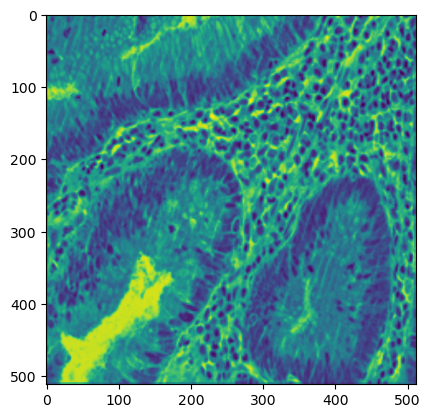

In [4]:
imshow(images[1001])

In [5]:
masks.shape

(2141, 512, 512, 1)

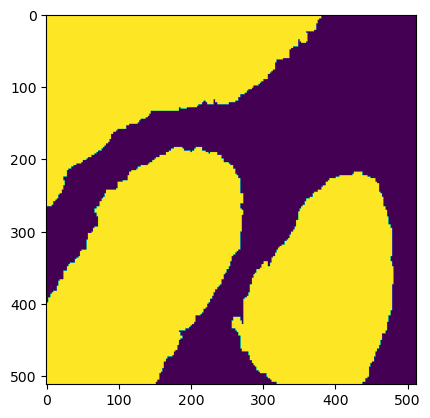

In [6]:
imshow(masks[1001])

In [7]:
import sys
sys.path.append('../')
import gp2

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
C = gp2.KUC_UNetPlus2D(loss=loss_fx)

*** GP2  KUC UNetPlus2D ***
Working directory: /tmp/tmptd7c4qymkuc_unetplus2d


In [11]:
hist = C.train(images[0:1700], masks[0:1700], images[1700:2141], masks[1700:2141], batch_size=32, patience_counter=4)

Epoch 1/100
54/54 [==============================] - 41s 570ms/step - loss: 0.6427 - dice_coeff: 0.6549 - val_loss: 0.6218 - val_dice_coeff: 0.6804
Epoch 2/100
54/54 [==============================] - 26s 477ms/step - loss: 0.6382 - dice_coeff: 0.6602 - val_loss: 0.6220 - val_dice_coeff: 0.6796
Epoch 3/100
54/54 [==============================] - 26s 476ms/step - loss: 0.6362 - dice_coeff: 0.6640 - val_loss: 0.6230 - val_dice_coeff: 0.6731
Epoch 4/100
54/54 [==============================] - 26s 475ms/step - loss: 0.6372 - dice_coeff: 0.6638 - val_loss: 0.6225 - val_dice_coeff: 0.6939
Epoch 5/100
54/54 [==============================] - 26s 476ms/step - loss: 0.6367 - dice_coeff: 0.6666 - val_loss: 0.6219 - val_dice_coeff: 0.6810
Epoch 6/100
54/54 [==============================] - 26s 477ms/step - loss: 0.6363 - dice_coeff: 0.6668 - val_loss: 0.6222 - val_dice_coeff: 0.6788
Epoch 7/100
54/54 [==============================] - 26s 478ms/step - loss: 0.6361 - dice_coeff: 0.6667 - val_lo

In [12]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

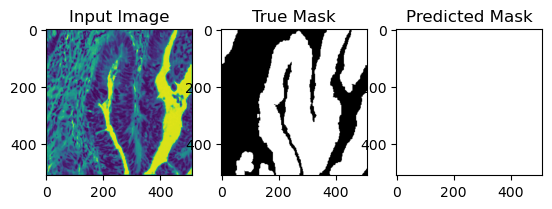

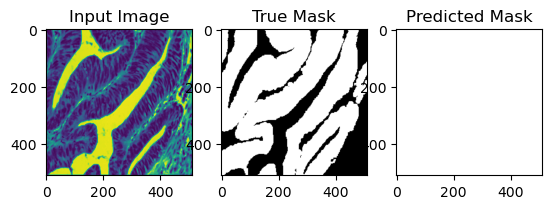

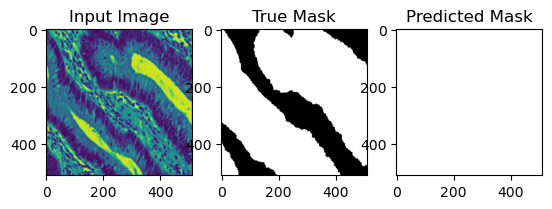

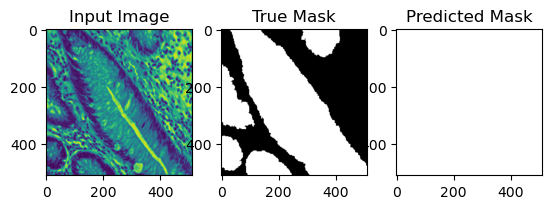

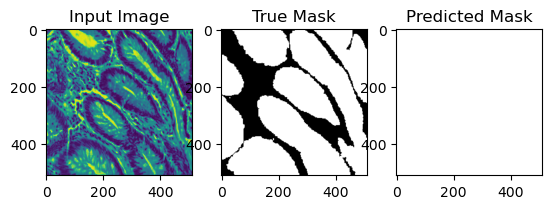

...

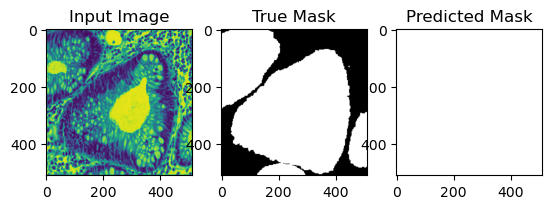

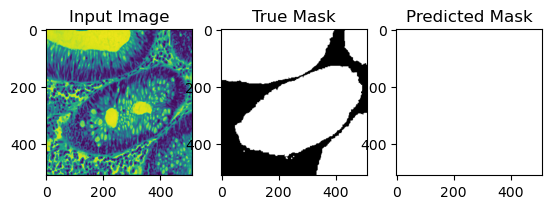

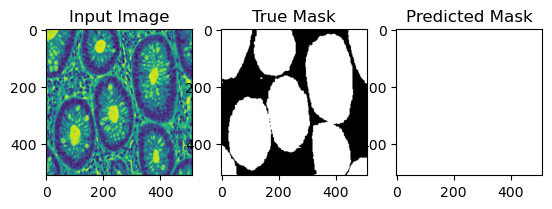

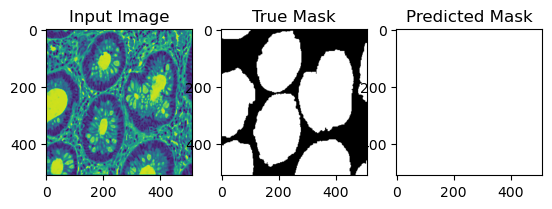

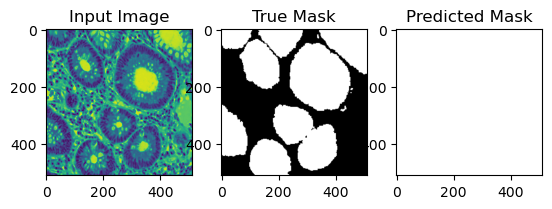

In [13]:
visualize_predictions(C, images[1700:2141], masks[1700:2141], num_samples=100)